# **Importing the libraries and define functions**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
from sklearn.utils import check_random_state
#Parameter estimation
import optunity
import optunity.metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import TimeSeriesSplit
#SVR model
from sklearn.svm import SVR
from sklearn.ensemble import VotingRegressor
#Data splitting
from sklearn.model_selection import train_test_split
#Feature scaling (Normalize)
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
#Noise reduction
from scipy.signal import savgol_filter
#Metrics
from scipy import stats
import sklearn.metrics as metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
#Visualize
import matplotlib.pyplot as plt
#File management
import os.path
import os, glob
import csv
from os import listdir
from os.path import isfile, join

Group of functions that reverse the standar scale, and normalization

In [2]:
def inverse_scaler(y_true, y_pred):
    y_true = y_true.reshape(-1,1)
    y_pred = y_pred.reshape(-1,1)
    y_true = sc_y.inverse_transform(y_true)
    y_pred = sc_y.inverse_transform(y_pred)
    y_true = y_true.ravel()
    y_pred = y_pred.ravel()
    return y_true, y_pred

def inverse_normalize(x):
    for i, ob in enumerate(x):
        x[i]=(x[i]*(dataset['CO2'].max()-dataset['CO2'].min())+dataset['CO2'].min())
    return x

This function allow us to get the percentage to split the data in order to get the number of instances equivalent to a period of time (1 hour, 3 hours...)

In [3]:
def get_percentage(x, total):
    return ((x*100)/total)/100

Function that plots the predictions and the true values to compare them, and saves the results as csv.

In [4]:
def plot_accuracy(y_true, y_pred, xax_, t_s, dates, file, score):
    """    y_true = inverse_normalize(y_true)
    y_pred = inverse_normalize(y_pred)
    y_true = y_true.reshape(-1,1)
    y_pred = y_pred.reshape(-1,1)"""

    xax=xax_
    ig=plt.figure(figsize=(25, 12), dpi= 80, facecolor='w', edgecolor='k')
    plt.plot(y_true[0::xax], label='y_true')
    plt.plot(y_pred[0::xax], label='y_pred')
    min_y_bound = min(min(y_true), min(y_true))
    max_y_bound = max(max(y_true), max(y_true))
    step = abs(max_y_bound-min_y_bound)/50

    plt.yticks(np.arange(min_y_bound, max_y_bound+step, step))
    plt.xticks(np.arange(0, y_true[0::xax].size+1,1), dates[0::xax], rotation=70)

 
    plt.xlabel('Instances')
    plt.ylabel('CO2')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.savefig("graphs/"+file+"_test{test_s:.4f}_score{score:.3f}.png".format(test_s=t_s, score = score))
    fname = "predictions/"+file+"_test{test_s:.4f}_score{score:.3f}.csv".format(test_s=t_s, score = score)
    y_true = np.ravel(y_true)
    y_pred = np.ravel(y_pred)
    df = pd.DataFrame({"y_true" : y_true, "y_pred" : y_pred})
    df.to_csv(fname, index=False, sep=";")

In order to do the parameter optimization we need to import the libraries and the metrics in which we are going to measure the quality of the model:


*   R2_Score \begin{equation} R2 = 1-\frac{\sum \left (  y_{i}-\check{y_{i}} \right )^2}{\sum \left (  y_{i}-\bar{y_{i}} \right )^2} \end{equation}
*   Mean Squared Error (MSE) \begin{equation} MSE = \frac{1}{n} \sum \left ( y_{i}-\check{y_{i}}\right )^{2} \end{equation}
*   Mean Absolute Error (MAE) \begin{equation} MAE = \frac{1}{n} \sum \left |  y_{i}-\check{y_{i}}\right | \end{equation}
*   Root Mean Squared Error (RMSE) \begin{equation} RMSE = \sqrt{MSE} = \sqrt{\frac{1}{n} \sum \left ( y_{i}-\check{y_{i}}\right )^{2}} \end{equation}





In [5]:
def regression_results(y_true, y_pred):
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    r2=metrics.r2_score(y_true, y_pred)
    metrics_dic = {'r2':round(r2,4), 'mae':round(mean_absolute_error,4), 'mse':round(mse,10), 'rmse':round(np.sqrt(mse),4)}
    return metrics_dic  

# **Importing the dataset**
Read the folder with the files, and save every filename to read it later.

In [6]:
data_path = 'data/'
onlyfiles = [f for f in listdir(data_path) if isfile(join(data_path, f))]
models = []
test_ensemble= {}

# **Data visualization**
### Plot the data in order to visualize possible outliers

In [7]:
filename = 'livingroom_K4'
pre_data = pd.read_csv('data/'+filename+'.csv', delimiter=";", parse_dates=True)
pre_data['Time'] = pd.to_datetime(pre_data.Time) 
pre_data['Timestamp'] = pd.to_datetime(pre_data.Time,format='%d-%m-%Y %H:%M') 
pre_data.index = pre_data.Timestamp

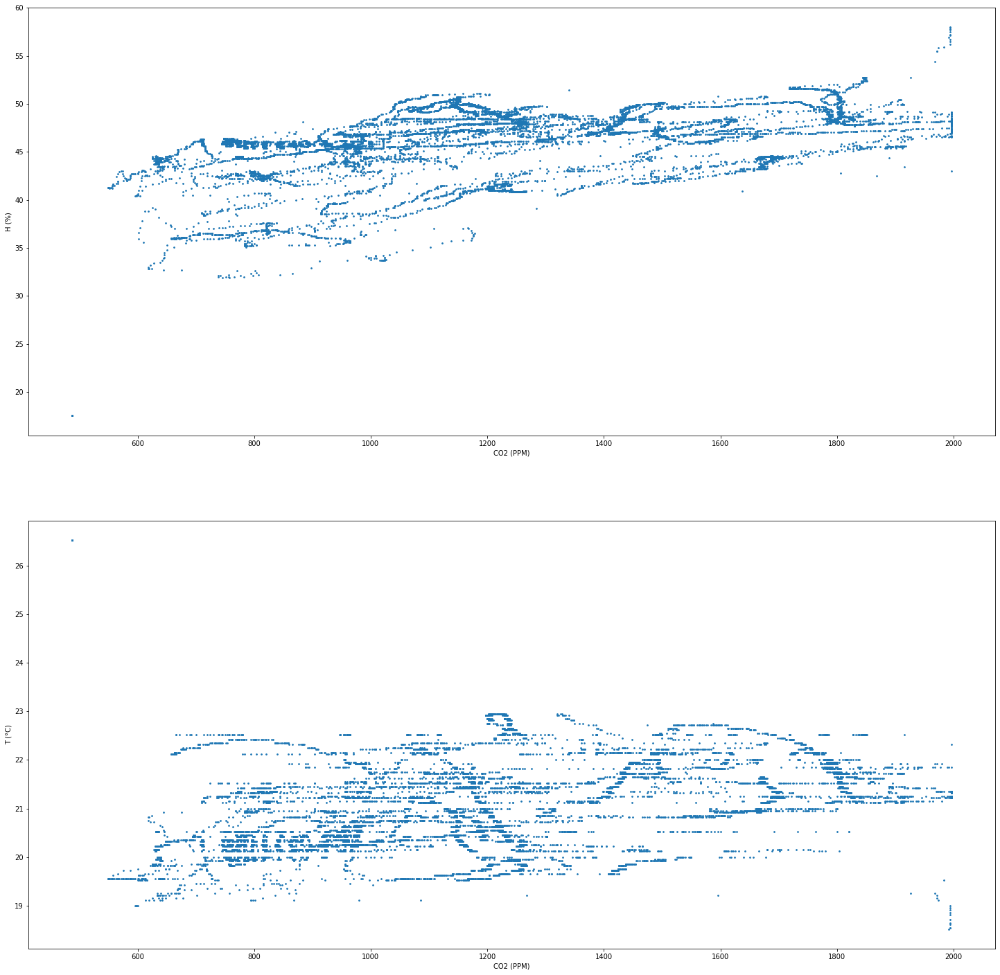

In [8]:
fig, ax = plt.subplots(2,1,figsize=(25,25))
ax[0].scatter(pre_data['CO2'], pre_data['H'], s=3, cmap="Blues")
ax[0].set_xlabel('CO2 (PPM)')
ax[0].set_ylabel('H (%)')
ax[1].scatter(pre_data['CO2'], pre_data['T'], s=3, cmap="Blues")
ax[1].set_xlabel('CO2 (PPM)')
ax[1].set_ylabel('T (°C)')
plt.show()

Text(0.5, 0, 'H (%)')

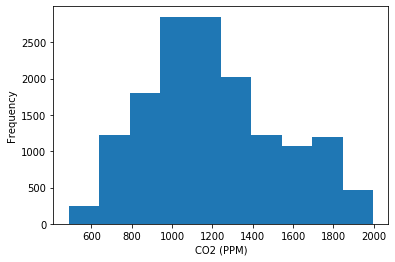

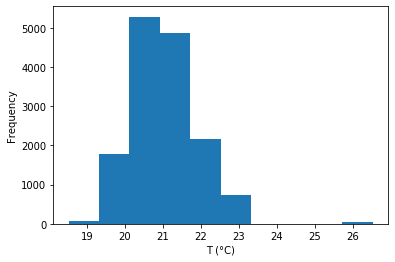

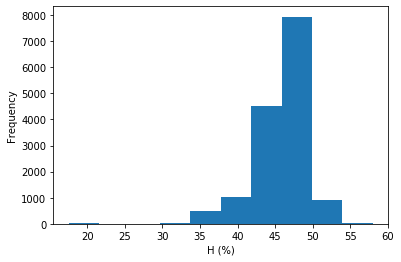

In [9]:
pre_data['CO2'].plot.hist()
plt.xlabel('CO2 (PPM)')
plt.figure()
pre_data['T'].plot.hist()
plt.xlabel('T (°C)')
plt.figure()
pre_data['H'].plot.hist()
plt.xlabel('H (%)')


As we can see, it's possible to see some outliers, so we have to work to detect and delete them so we get better predictions

# **Data preprocessing**

### Detect and remove outliers
Calculate Z-score to remove outliers which their Z-score is lower than 3.
\begin{equation}
    z = \frac{x-\mu}{\sigma}
\end{equation}

In [10]:
def remove_outliers(dataset):
    z = np.abs(stats.zscore(dataset.iloc[:,1:4]))
    threshold = 3
    return dataset[(z < threshold).all(axis=1)]

### Data filtering (Noise reduction)
Filter data with Savitzky-golay filter. The windows length is set to 7, and the polynomial order to 1.

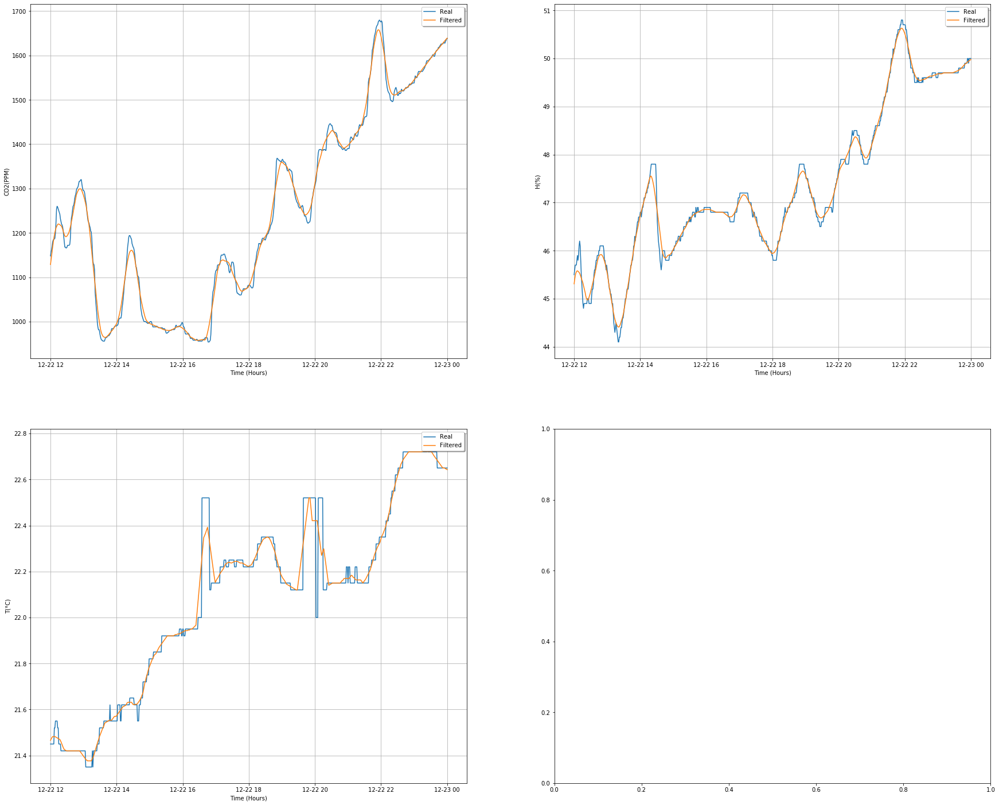

In [11]:

windows_len = 21
poly_order = 1
pre_data['CO2_']= savgol_filter(pre_data['CO2'], windows_len, poly_order)
pre_data['H_']= savgol_filter(pre_data['H'], windows_len, poly_order)
pre_data['T_']= savgol_filter(pre_data['T'], windows_len, poly_order)
fig, axs = plt.subplots(2,2,figsize=(30,25))

start = '22-Dec-2018 12:00:00'
end = '23-Dec-2018 00:00:00'

axs[0][0].plot(pre_data['CO2'][start:end])
axs[0][0].plot(pre_data['CO2_'][start:end])
axs[0][0].legend(('Real', 'Filtered'), loc='upper right', shadow=True)
axs[0][0].set_xlabel('Time (Hours)')
axs[0][0].set_ylabel('CO2(PPM)')
plt.sca(axs[0][0])
plt.grid()

axs[0][1].plot(pre_data['H'][start:end])
axs[0][1].plot(pre_data['H_'][start:end])
axs[0][1].legend(('Real', 'Filtered'), loc='upper right', shadow=True)
axs[0][1].set_xlabel('Time (Hours)')
axs[0][1].set_ylabel('H(%)')
plt.sca(axs[0][1])
plt.grid()

axs[1][0].plot(pre_data['T'][start:end])
axs[1][0].plot(pre_data['T_'][start:end])
axs[1][0].legend(('Real', 'Filtered'), loc='upper right', shadow=True)
axs[1][0].set_xlabel('Time (Hours)')
axs[1][0].set_ylabel('T(°C)')
plt.sca(axs[1][0])
plt.grid()

In [11]:
def filter_data(data):
    dataset_filtered = data.copy()
    dataset_filtered['CO2']= savgol_filter(dataset_filtered['CO2'], windows_len, poly_order)
    dataset_filtered['H']= savgol_filter(dataset_filtered['H'], windows_len, poly_order)
    dataset_filtered['T']= savgol_filter(dataset_filtered['T'], windows_len, poly_order)
    return dataset_filtered

### Data normalization
In order to normalize the data we apply to the dataset the next formula:
\begin{equation}
    X_{norm} = \frac{X-X_{min}}{X_{max}-X_{min}}
\end{equation}

In [12]:
def normalize_data(data):
    dataset_normalized = data.copy()
    dataset_normalized['CO2'] = ((dataset_normalized['CO2']-dataset_normalized['CO2'].min())/(dataset_normalized['CO2'].max()-dataset_normalized['CO2'].min()))
    dataset_normalized['H'] = ((dataset_normalized['H']-dataset_normalized['H'].min())/(dataset_normalized['H'].max()-dataset_normalized['H'].min()))
    dataset_normalized['T'] = ((dataset_normalized['T']-dataset_normalized['T'].min())/(dataset_normalized['T'].max()-dataset_normalized['T'].min()))
    return dataset_normalized

### Variable preparation
Get the percentages of the different test sizes (3 hour, 6 hour, 1 day, 3 day), to test the trained model in different ranges of time.

In [13]:
def get_percentage_list(total_size):
    one_hour = get_percentage(60, total_size)
    three_hour = get_percentage(180, total_size)
    six_hour = get_percentage(360, total_size)
    one_day = get_percentage(1440, total_size)
    #three_day = get_percentage(3*1440, total_size)
    return [one_hour, three_hour, six_hour, one_day] #, three_day]

Create the dataframe which we will export later, to save the scores and parameters of each model.

In [14]:
output = pd.DataFrame(columns=['r2', 'mae', 'mse', 'rmse', 'test_size'])

### Data and class
Now prepare the X and y variables.

In [15]:
def split_XY(data):
    X = data.iloc[:,2:4].values.astype(float)
    y = data.iloc[:,1:2].values.astype(float)
    return X,y

### Data scalation
Scale the data in order to get better accuracy

In [16]:
sc_X = StandardScaler()
sc_y = StandardScaler()

def scale_data(X,y):
    X = sc_X.fit_transform(X)
    y = sc_y.fit_transform(y)
    y = np.ravel(y)
    return X,y

### Split data between train and test

In [17]:
def split_data(data, train_size, test_size, s):
    return train_test_split(data, train_size=train_size, test_size=test_size, random_state=check_random_state(0), shuffle=s)


### Parameter estimation

GridSearchCV is a tool offered by Scikit-learn which help us to set different parameters and it will select and train the model with the best combination of those parameters.

In [18]:
def estimate_parameters(X_train, y_train):
    tscv = TimeSeriesSplit(n_splits=3)
    gamma_range = np.logspace(0.0001,9,base=2, num=40)
    C_range = np.logspace(0.0001,9,base=2, num=40)
    epsilon_range = [0.01, 0.05, 0.1, 0.125, 0.2, 0.5, 0.7, 0.9]
    tuned_parameters = [{'kernel': ['rbf'], 'gamma': gamma_range, 'C': C_range, 'epsilon':epsilon_range }]
    #grid_regressor = GridSearchCV(SVR(), tuned_parameters, scoring='r2', cv=3)
    grid_regressor = RandomizedSearchCV(SVR(), tuned_parameters, scoring='r2', cv=tscv, verbose=1, n_iter=10)
    grid_regressor.fit(X_train, y_train)
    return grid_regressor

### Model train and creation
Create the model with the optimal parameters.

In [19]:
def create_model(C, gamma, epsilon):
    regressor = SVR(kernel='rbf',
                    C=C,
                    gamma=gamma,
                    epsilon=epsilon)
    return regressor


### Data prediction

In [20]:
def predict_data(regressor, X_, y_):
    y_true, y_pred = y_, regressor.predict(X_)
    return y_true, y_pred

# Train the models
Execute all the functions created before in order to obtain the models for each file

In [32]:
data_path = 'data/'
onlyfiles = [f for f in listdir(data_path) if isfile(join(data_path, f))]
models = []
test_ensemble= {}
#Iterate through files
data_train_ensemble = []
for file in onlyfiles:
    filename = os.path.splitext(file)[0]
    dataset = pd.read_csv('data/'+filename+'.csv', delimiter=";", parse_dates=True)
    print('Working with: ', file)
    dataset['Time'] = pd.to_datetime(dataset.Time) 
    dataset['Timestamp'] = pd.to_datetime(dataset.Time,format='%d-%m-%Y %H:%M') 
    dataset.index = dataset.Timestamp

    #Remove outliers
    dataset_no_out = remove_outliers(dataset)

    #Data filtering
    print('Filtering data...')
    windows_len = 41
    poly_order = 1
    dataset_filtered = filter_data(dataset_no_out)
    
    #Data normalization
    dataset_normalized = normalize_data(dataset_filtered)

    train_size = 0.7
    test_size = 0.3

    #Split between traind and test
    print('Data split (Traind and test)')
    print('\tTest instances: ', round(dataset.shape[0]*test_size,0))
    print('\tTrain instances: ', round(dataset.shape[0]*train_size,0))


    train_data, test_data = split_data(dataset_normalized,train_size, test_size, True)

    #Save test and train data for the ensemble
    test_ensemble[filename]=(test_data)
    data_train_ensemble.append(train_data)
    #print(train_data)

    #Split between X and y (train and test)
    X_train, y_train = split_XY(train_data)

    #Data scale
    print('Data scale')
    X_train,y_train = scale_data(X_train,y_train)

    #Parameter estimation
    print('Parameter tuning')
    grid_regressor=estimate_parameters(X_train, y_train)

    #Save best parameters
    C = grid_regressor.best_params_['C']
    gamma = grid_regressor.best_params_['gamma']
    epsilon = grid_regressor.best_params_['epsilon']
    print('Training model...')

    #Model creation
    regressor=create_model(C, gamma, epsilon)

    #Save model for ensemble
    models.append(regressor)
print("************************ Model training finished ************************")

Working with:  bathroom_K1.csv
Filtering data...
Data split (Traind and test)
	Test instances:  4481.0
	Train instances:  10455.0
Data scale
Parameter tuning
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  3.8min finished
Training model...
Working with:  bedroom_K3.csv
Filtering data...
Data split (Traind and test)
	Test instances:  4481.0
	Train instances:  10455.0
Data scale
Parameter tuning
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 27.9min finished
Training model...
Working with:  kidsroom_K5.csv
Filtering data...
Data split (Traind and test)
	Test instances:  4481.0
	Train instances:  10455.0
Data scale
Parameter tuning
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[Paral

# Model Ensemble

In [33]:
data_train_ensemble_concat=pd.concat(data_train_ensemble)
X_train, y_train = split_XY(data_train_ensemble_concat)
X_train,y_train = scale_data(X_train,y_train)

In [34]:
ensemble_model = VotingRegressor(estimators=[('1', models[0]),('2', models[1]),('3', models[2]),('4', models[3]),('5', models[4])])

In [35]:
ensemble_model.fit(X_train, y_train)

VotingRegressor(estimators=[('1',
                             SVR(C=1.173539715170057, cache_size=200, coef0=0.0,
                                 degree=3, epsilon=0.125,
                                 gamma=371.82157284022526, kernel='rbf',
                                 max_iter=-1, shrinking=True, tol=0.001,
                                 verbose=False)),
                            ('2',
                             SVR(C=436.31713843739345, cache_size=200,
                                 coef0=0.0, degree=3, epsilon=0.125,
                                 gamma=33.75353426493147, kernel='rbf',
                                 max_iter=-1, shrinking=True, tol=0.001,
                                 ve...
                             SVR(C=4.951160325931975, cache_size=200, coef0=0.0,
                                 degree=3, epsilon=0.2, gamma=54.54090245254164,
                                 kernel='rbf', max_iter=-1, shrinking=True,
                                 to

# Test Ensemble

Saving results for file: bathroom_K1 with test size: 60 instances...

Saving results for file: bathroom_K1 with test size: 180 instances...

Saving results for file: bathroom_K1 with test size: 360 instances...

Saving results for file: bathroom_K1 with test size: 1440 instances...

Saving results for file: bedroom_K3 with test size: 60 instances...

Saving results for file: bedroom_K3 with test size: 180 instances...

Saving results for file: bedroom_K3 with test size: 360 instances...

Saving results for file: bedroom_K3 with test size: 1440 instances...

Saving results for file: kidsroom_K5 with test size: 60 instances...

Saving results for file: kidsroom_K5 with test size: 180 instances...

Saving results for file: kidsroom_K5 with test size: 360 instances...

Saving results for file: kidsroom_K5 with test size: 1440 instances...

Saving results for file: kitchen_K2 with test size: 59 instances...

Saving results for file: kitchen_K2 with test size: 180 instances...

Saving result

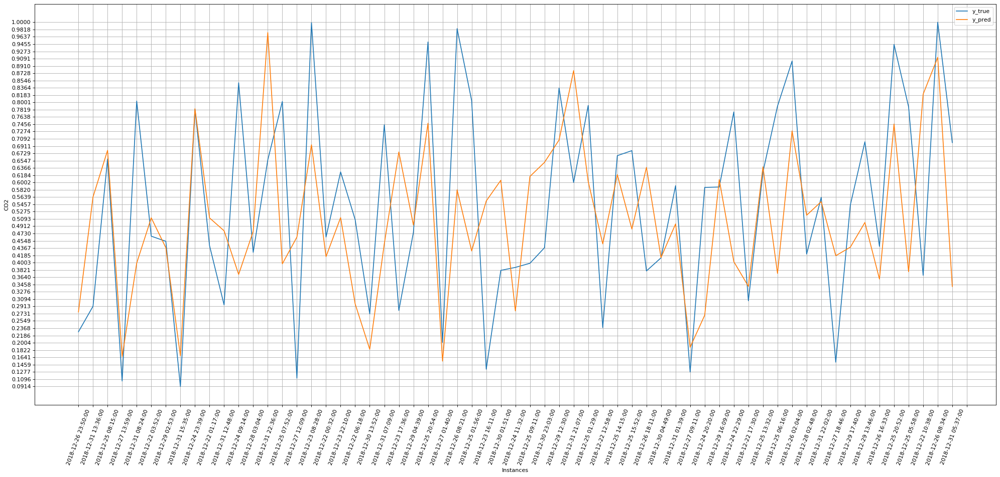

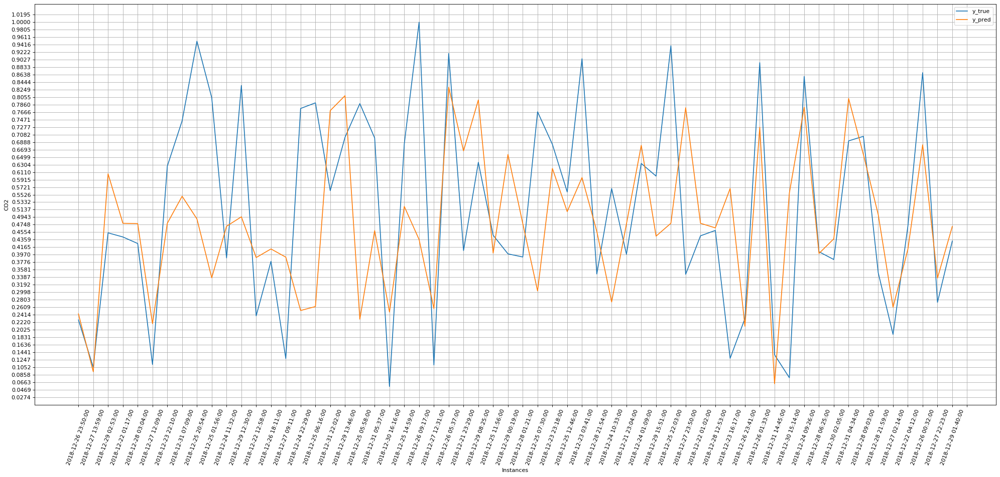

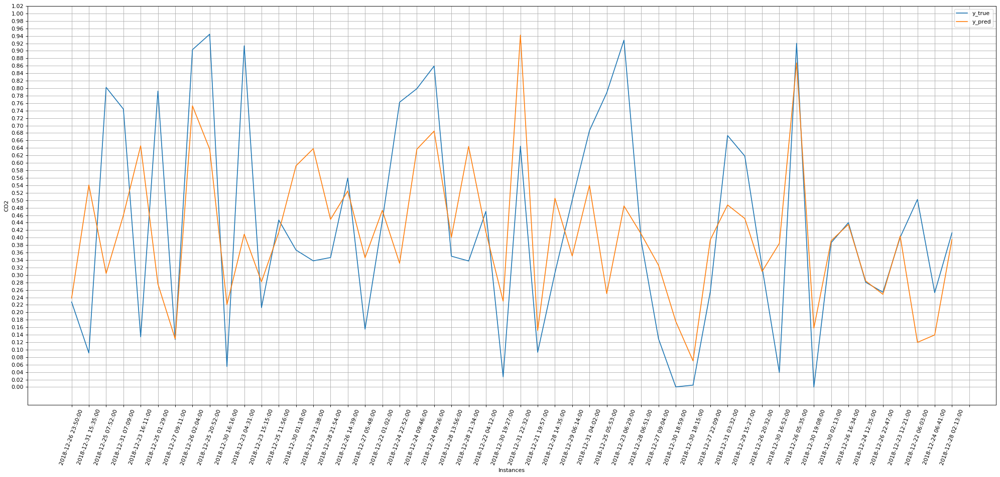

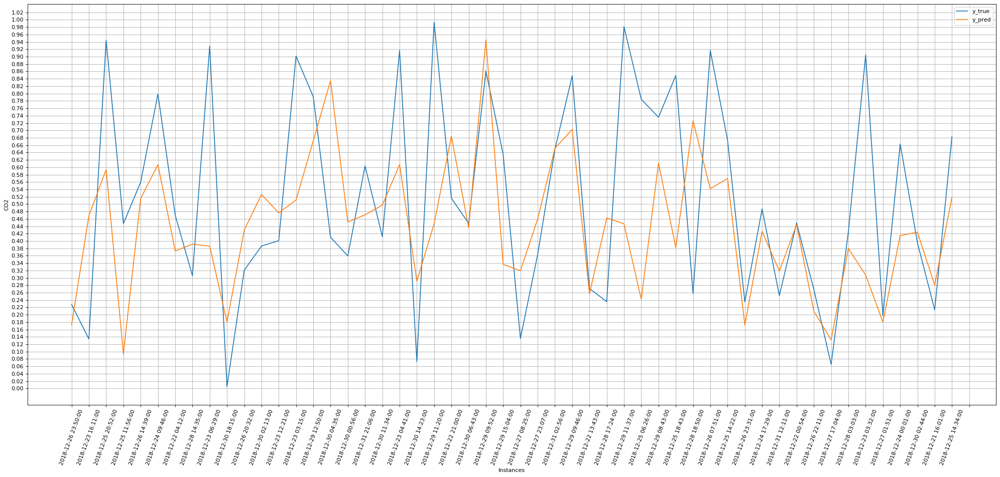

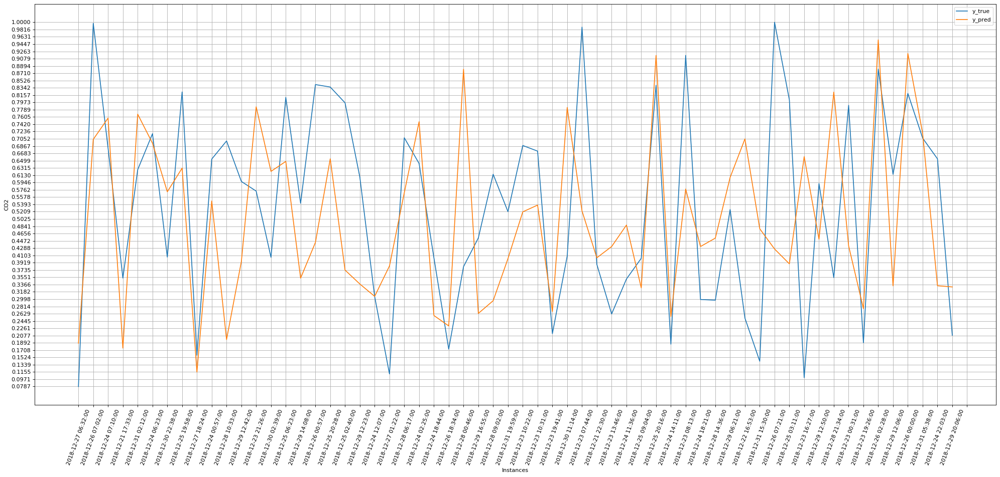

...

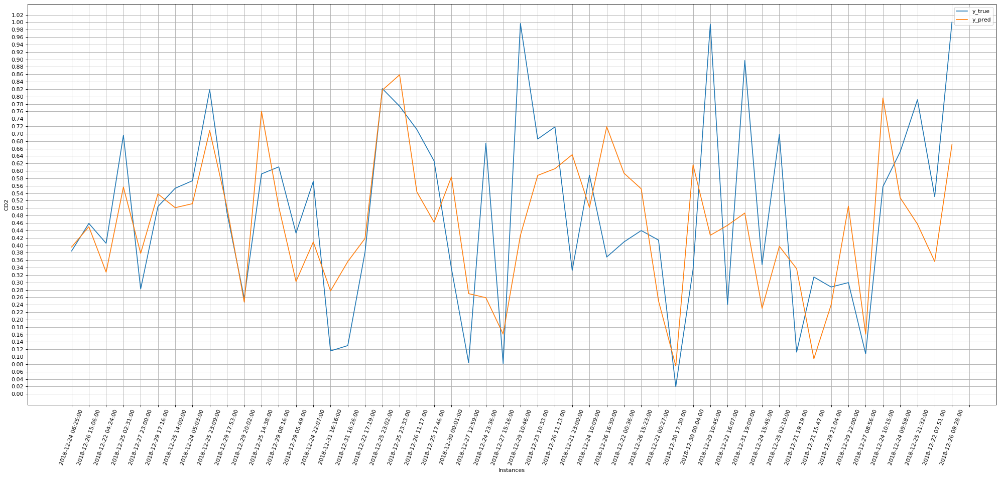

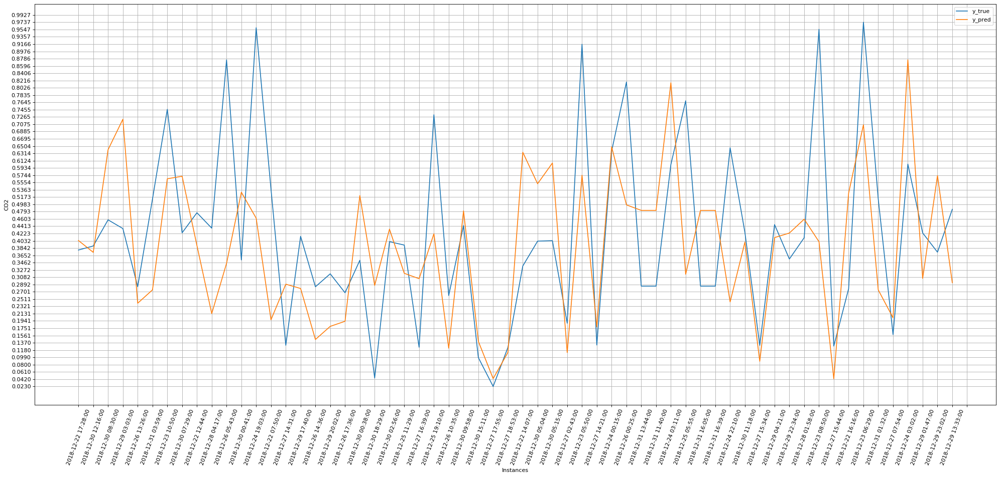

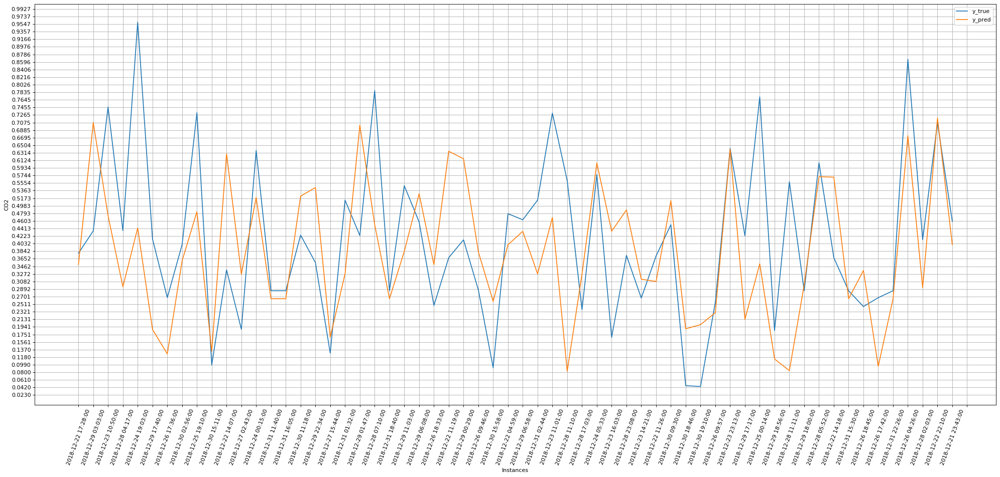

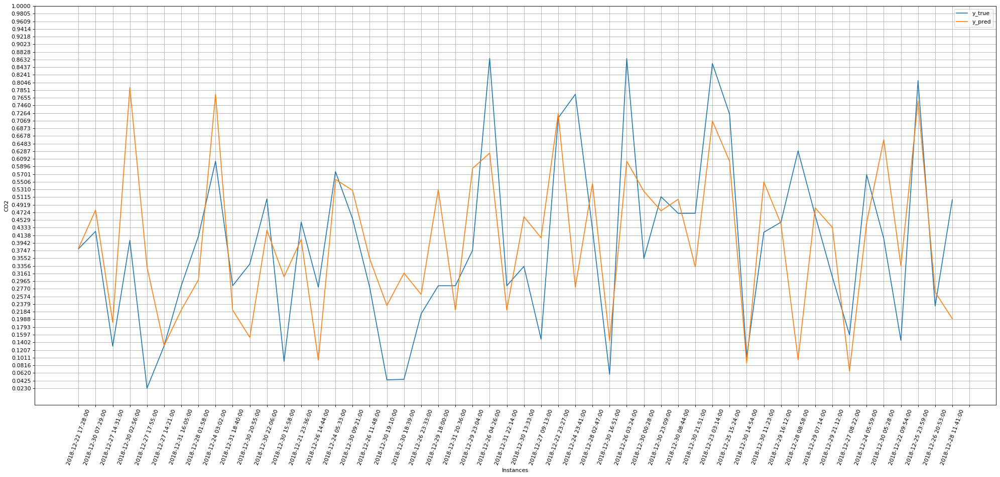

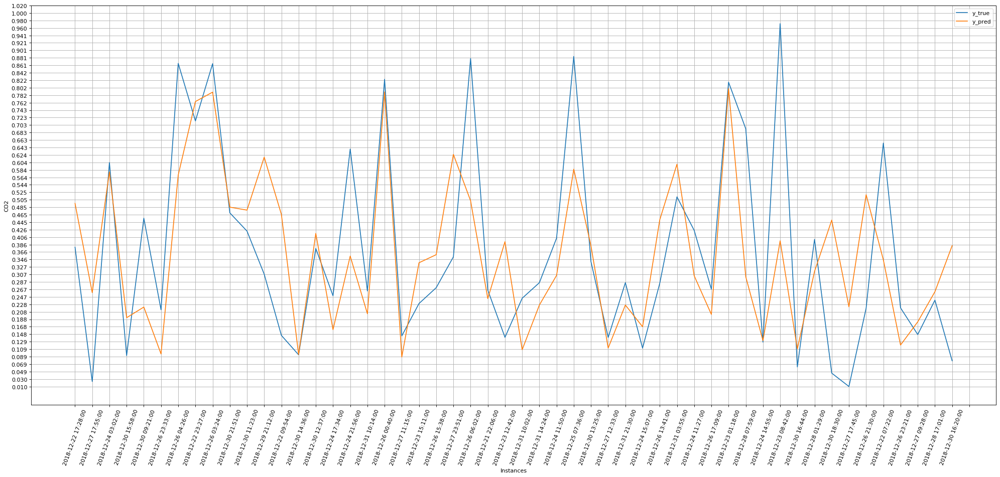

In [36]:
output = pd.DataFrame(columns=['r2', 'mae', 'mse', 'rmse', 'test_size'])
for j in test_ensemble:   

    test_s = get_percentage_list(test_ensemble[j].shape[0])

   
    for i, o in enumerate(test_s):
        _, test_split = split_data(test_ensemble[j], None, test_s[i], True)
        #Split between X and y data
        X_test, y_test = split_XY(test_split)
        X_test,y_test = scale_data(X_test,y_test)

        y_true = y_test
        y_pred=ensemble_model.predict(X_test)

        #Inverse the data scale
        y_true,y_pred = inverse_scaler(y_true, y_pred)

        print('Saving results for file: '+str(j)+' with test size: '+str(int(o*test_ensemble[j].shape[0]))+' instances...\n')
        #Get scores and save them
        results_test=regression_results(y_true,y_pred)
        test_score = round(results_test['r2'],2)
        results_test['test_size']=round(test_s[i],4)
        results_test['test_instances']=int(o*test_ensemble[j].shape[0])
        results_test['train_size']=round(train_size,4)
        test_dic = pd.DataFrame(results_test, index=[0])
        output = output.append(test_dic, ignore_index=True)
        dates = test_split['Time']
        #Plot the graphs
        plot_accuracy(y_true, y_pred, int(y_true.size/50), test_s[i], dates, str(j), test_score)
print("************************ Ensemble model testing finished ************************")

In [37]:
print(output)
#output.to_csv('configuration_models/model_score'+str(test_score)+'.csv', mode='a', header=True)  

r2     mae       mse    rmse  test_size  test_instances  train_size
0   0.1132  0.1898  0.056095  0.2368     0.0137            60.0         0.7
1   0.0860  0.1822  0.055857  0.2363     0.0412           180.0         0.7
2   0.0391  0.1980  0.064555  0.2541     0.0824           360.0         0.7
3   0.1214  0.1918  0.060274  0.2455     0.3295          1440.0         0.7
4  -0.0295  0.2115  0.066831  0.2585     0.0136            60.0         0.7
5  -0.1285  0.2066  0.064733  0.2544     0.0409           180.0         0.7
6   0.1244  0.1873  0.058575  0.2420     0.0818           360.0         0.7
7   0.1135  0.1852  0.055813  0.2362     0.3271          1440.0         0.7
8   0.4602  0.1431  0.039476  0.1987     0.0135            60.0         0.7
9   0.0112  0.2179  0.059012  0.2429     0.0405           180.0         0.7
10  0.2597  0.1842  0.044841  0.2118     0.0810           360.0         0.7
11  0.2594  0.1651  0.042281  0.2056     0.3238          1440.0         0.7
12  0.0901  0.1948  

Manually remove the memory occupied with the garbage collector to not freeze the computer.

In [28]:
import gc
gc.collect()

155